# Final Presentation: Predicting Forest Cover Types
## Group: Jing An, Stephanie Cabanela, Catherine Jimerson, Amangeet Samra

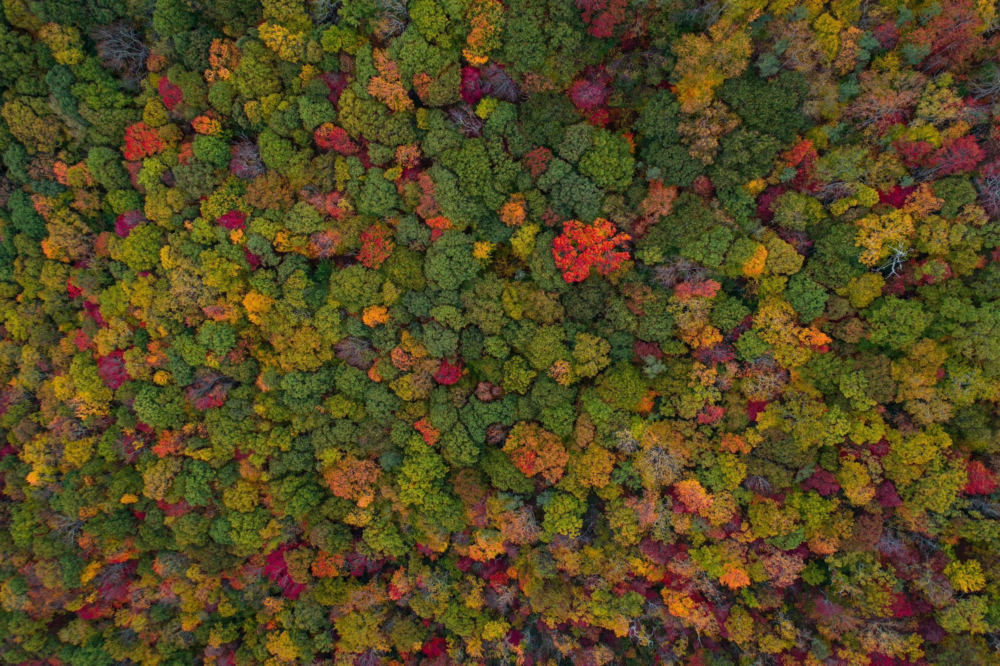

In [1]:
from IPython.display import Image
Image(filename='./images/nathan-anderson-forest-unsplash.jpg', width=1000)

Photo by <a href="https://unsplash.com/@nathananderson?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Nathan Anderson</a> on <a href="https://unsplash.com/photos/UFnHt94r91w?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Unsplash</a>

# About the Dataset
<a href="https://www.kaggle.com/c/forest-cover-type-prediction">Kaggle</a> Description:
<blockquote>The actual forest cover type for a given 30 x 30 meter cell was determined from US Forest Service (USFS) Region 2 Resource Information System data. Independent variables were then derived from data obtained from the US Geological Survey and USFS. The data is in raw form (not scaled) and contains binary columns of data for qualitative independent variables such as wilderness areas and soil type.
<br>
This study area includes four wilderness areas located in the Roosevelt National Forest of northern Colorado. These areas represent forests with minimal human-caused disturbances, so that existing forest cover types are more a result of ecological processes rather than forest management practices.
</blockquote>

* Each observation: 30m x 30m forest patch
* Data sources:
    * Cover types: US Forest Service (USFS) Region 2 Resource Information System
    * Features: US Geological Survey and USFS

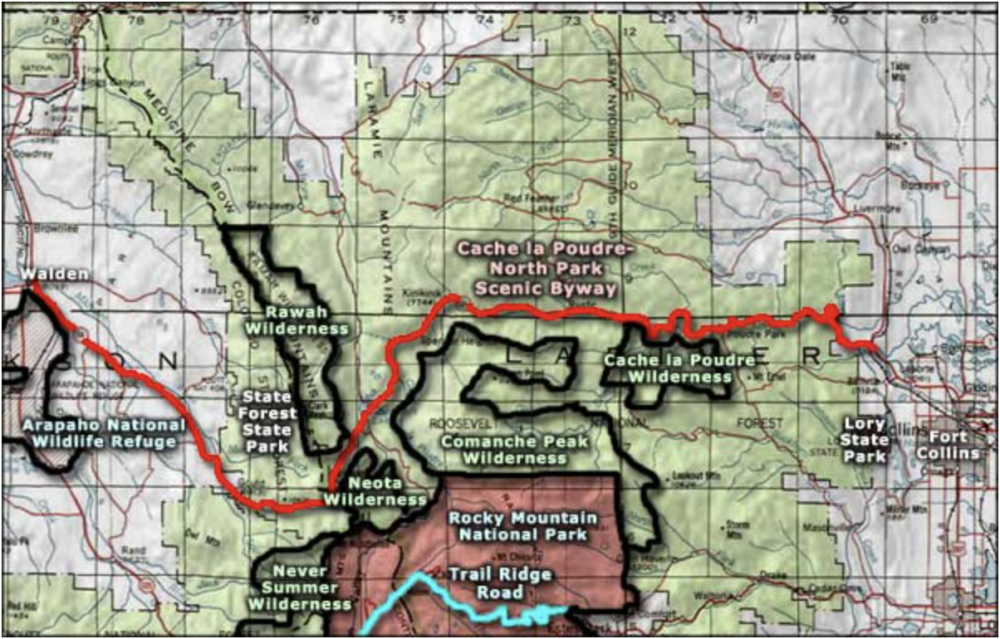

In [2]:
Image(filename='./images/Wilderness_areas_map.jpg', width=700)

### Dataset Variables
The variables in this data set are:

Variable Name                        | Description                                   | Description of Values
:----------------------------------- | :-------------------------------------------- | :-----------------------------------------------
`Elevation`                          | Elevation in meters                           |
`Aspect`                             | Aspect in degrees azimuth                     |
`Slope`                              | Slope in degrees                              |
`Horizontal_Distance_To_Hydrology`   | Horz Dist to nearest surface water features   |
`Vertical_Distance_To_Hydrology`     | Vert Dist to nearest surface water features   |
`Horizontal_Distance_To_Roadways`    | Horz Dist to nearest roadway                  |
`Hillshade_9am`                      | Hillshade index at 9am, summer solstice       | (0 to 255 index)
`Hillshade_Noon`                     | Hillshade index at noon, summer solstice      | (0 to 255 index)
`Hillshade_3pm`                      | Hillshade index at 3pm, summer solstice       | (0 to 255 index)
`Horizontal_Distance_To_Fire_Points` | Horz Dist to nearest wildfire ignition points |
`Wilderness_Area`                    | Wilderness area designation                   | (4 binary columns, 0 = absence or 1 = presence)
`Soil_Type`                          | Soil Type designation                         | (40 binary columns, 0 = absence or 1 = presence)
`Cover_Type`                         | Forest Cover Type designation                 | (7 types, integers 1 to 7)

#### Wilderness Area
Code | Name
:--- | :---------------------
1    | Rawah Wilderness Area
2    | Neota Wilderness Area
3    | Comanche Peak Wilderness Area
4    | Cache la Poudre Wilderness Area

#### Soil Types
Code | Name                                                            | Code | Name
:--- | :-------------------------------------------------------------- | :--- | :-----------------------------------------------------------
1    | Cathedral family - Rock outcrop complex, extremely stony.       | 21   | Typic Cryaquolls - Leighcan family, till substratum complex.
2    | Vanet - Ratake families complex, very stony.                    | 22   | Leighcan family, till substratum, extremely bouldery.
3    | Haploborolis - Rock outcrop complex, rubbly.                    | 23   | Leighcan family, till substratum - Typic Cryaquolls complex.
4    | Ratake family - Rock outcrop complex, rubbly.                   | 24   | Leighcan family, extremely stony.
5    | Vanet family - Rock outcrop complex complex, rubbly.            | 25   | Leighcan family, warm, extremely stony.
6    | Vanet - Wetmore families - Rock outcrop complex, stony.         | 26   | Granile - Catamount families complex, very stony.
7    | Gothic family.                                                  | 27   | Leighcan family, warm - Rock outcrop complex, extremely stony.
8    | Supervisor - Limber families complex.                           | 28   | Leighcan family - Rock outcrop complex, extremely stony.
9    | Troutville family, very stony.                                  | 29   | Como - Legault families complex, extremely stony.
10   | Bullwark - Catamount families - Rock outcrop complex, rubbly.   | 30   | Como family - Rock land - Legault family complex, extremely stony.
11   | Bullwark - Catamount families - Rock land complex, rubbly.      | 31   | Leighcan - Catamount families complex, extremely stony.
12   | Legault family - Rock land complex, stony.                      | 32   | Catamount family - Rock outcrop - Leighcan family complex, extremely stony.
13   | Catamount family - Rock land - Bullwark family complex, rubbly. | 33   | Leighcan - Catamount families - Rock outcrop complex, extremely stony.
14   | Pachic Argiborolis - Aquolis complex.                           | 34   | Cryorthents - Rock land complex, extremely stony.
15   | unspecified in the USFS Soil and ELU Survey.                    | 35   | Cryumbrepts - Rock outcrop - Cryaquepts complex.
16   | Cryaquolis - Cryoborolis complex.                               | 36   | Bross family - Rock land - Cryumbrepts complex, extremely stony.
17   | Gateview family - Cryaquolis complex.                           | 37   | Rock outcrop - Cryumbrepts - Cryorthents complex, extremely stony.
18   | Rogert family, very stony.                                      | 38   | Leighcan - Moran families - Cryaquolls complex, extremely stony.
19   | Typic Cryaquolis - Borohemists complex.                         | 39   | Moran family - Cryorthents - Leighcan family complex, extremely stony.
20   | Typic Cryaquepts - Typic Cryaquolls complex.                    | 40   | Moran family - Cryorthents - Rock land complex, extremely stony.

#### Cover Types
Code | Name
:--- | :----------------
1    | Spruce/Fir
2    | Lodgepole Pine
3    | Ponderosa Pine
4    | Cottonwood/Willow
5    | Aspen
6    | Douglas-fir
7    | Krummholz

# Problem Definition

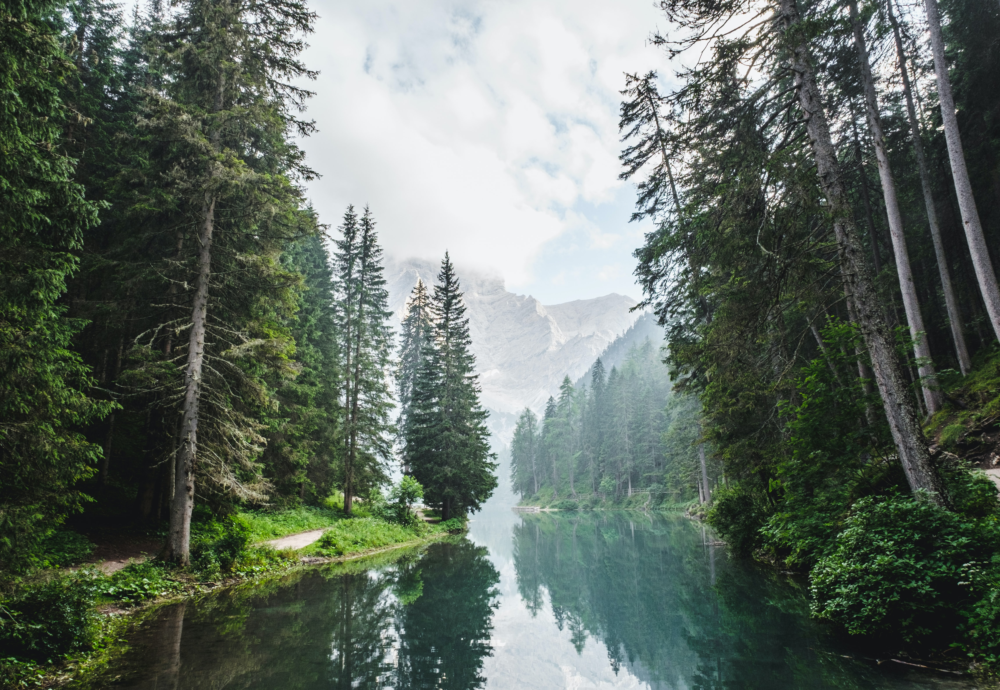

In [3]:
Image(filename='./images/trees_lake.jpg', width=1000)

Photo by <a href="https://unsplash.com/@lucabravo?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Luca Bravo</a> on <a href="https://unsplash.com/?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Unsplash</a>

Trees bring incredible value to life on Earth. They have several important functions, including:

* Trees <b><span style="color:green;font-style:italic">produce the oxygen</span></b> we breathe. They convert carbon dioxide to oxygen via photosynthesis.
* Trees <b><span style="color:green;font-style:italic">eat the greenhouse gases</span></b> that cause climate change by storing the carbon dioxide, which helps slow the gas's buildup in our environment.
* Trees <b><span style="color:green;font-style:italic">provide homes</span></b> to wildlife.
* Trees help <b><span style="color:green;font-style:italic">control the climate</span></b> by providing us with shade to protect us from the hot sun, providing a screen to protect us from harsh wind, and shielding us from rain.
* Trees absorb and store water, which <b><span style="color:green;font-style:italic">prevent the transport of chemicals</span></b> into streems and flooding.

<b><span style="font-style:italic">We need to help trees help us.</span></b>
Accurately predicting forest cover types is important for more efficient and effective tree management so that trees can continue to do a good job of nourishing the planet and supporting our lives. Accurate prediction can help with tasks including:

* Conservation measures
* Urban planning as Americans expand and continue to build
* Conservation of plant diversity
* Monitoring forest health and forest management
* Supplementing satellite imagery interpretation.
    * Topigraphical data like our dataset can reveal more about covertype than a satalite image could.

## Objective

**Goal:** *Our goal is to build a well-performing predictive model, learn about properties of different classifiers, and learn about the model building process along the way.*

We aim to explore different classifiers and make meaningful comparisons between model performance based on our knowledge of the dataset.

Our model evaluation criteria: 
* Classifier assmptions/pre-requisites - classifier should be appropriate for our dataset (high accuracy doesn't necessarily mean appropriate classifier)
* Interpretability
* Training/inference speed - if a model took too much time to run, we would take note of our efforts and move on in favor of exploring other models that ran faster that would allow us to understand them more deeply
* F1-score - balance between precision and recall, more useful for us than accuracy given our dataset imbalances



# Solution/approach description

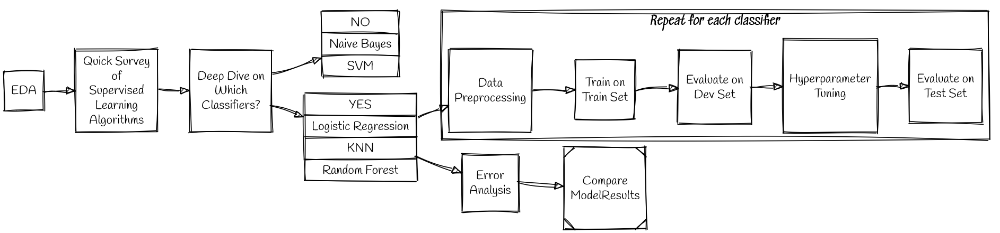

In [4]:
Image(filename='./images/approach_diagram.png', width=1500)

**Speaker Notes - HIDE**
Our general approach for this project:
* Data cleansing
    * check missing values, outliers
* EDA
    * discover any data imbalances
    * identify interesting relationships between features
    * identify potentially significant features for influencing cover type
* Quick survey of supervised learning algorithms we learned about in class
* Created baseline model
* Reviewed supervised learning classifiers and identified which are and are not appropriate for our dataset
    * Yes
        * Multinomial Logistic Regression
        * K-Nearest Neighbors
        * Decision Trees
        * Random Forest
    * No
        * Naive Bayes - indepedence assumptions would be heavily violated because of dependency between features
        * SVM - too process intensive, took up too much GPU --> limits # times we can run and do hyperparameter tuning, decided it was more fruitful to allocate time to iteratively improve on other models
* Data preprocessing to prep data to feed into model
* Ran classifiers
* Error analysis and hyperparameter tuning
* Ran our best models on the test set at the very end
* Compared classifier accuracies and reasoned why they performed differently based on what we understand about fundamental classifier behavior and the dataset

## Exploratory Data Analsyis (EDA)

#### Import Packages and Setup

In [1]:
import warnings
warnings.filterwarnings("ignore")

# Data Structures and Feature Processing
import numpy as np
import pandas as pd
from sklearn.preprocessing import scale
from sklearn.preprocessing import normalize
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

# Model Selection
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

# Metrics
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score

# Plotting
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from plotly import __version__
import plotly.express as px
from IPython.display import Javascript
Javascript(
"""require.config({
 paths: { 
     plotly: 'https://cdn.plot.ly/plotly-latest.min'
 }
});"""
)
from IPython.display import Javascript
from plotly.offline import get_plotlyjs
Javascript(get_plotlyjs())

# Algorithms
from sklearn import linear_model
from sklearn.linear_model import Perceptron
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC

In [2]:
def forest_confusion_matrix_plot(conf_matrix, title): # Source (GitHub): MIDS-W207/nteneva/live_sessions/week02/knn_classifier (scikit_class).ipynb
    fig, ax = plt.subplots(figsize=(7, 7))
    ax.matshow(conf_matrix, cmap=plt.cm.Blues, alpha=0.3)
    for i in range(conf_matrix.shape[0]):
        for j in range(conf_matrix.shape[1]):
            ax.text(x=j, y=i, s=conf_matrix[i, j], va='center', ha='center')
    ax.xaxis.set_ticks_position("bottom")
    ax.xaxis.set_ticklabels(['', '1', '2', '3', '4', '5', '6', '7', ''])
    ax.yaxis.set_ticklabels(['', '1', '2', '3', '4', '5', '6', '7', ''])
    plt.title(title)
    plt.xlabel('Predicted label', labelpad=10)
    plt.ylabel('True label', labelpad=10)
    plt.show()

#### Preview the Data

In [3]:
forest_data_labeled_raw = pd.read_csv('data/train.csv', sep=",")
forest_data_labeled_raw.head(10)

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,2596,51,3,258,0,510,221,232,148,...,0,0,0,0,0,0,0,0,0,5
1,2,2590,56,2,212,-6,390,220,235,151,...,0,0,0,0,0,0,0,0,0,5
2,3,2804,139,9,268,65,3180,234,238,135,...,0,0,0,0,0,0,0,0,0,2
3,4,2785,155,18,242,118,3090,238,238,122,...,0,0,0,0,0,0,0,0,0,2
4,5,2595,45,2,153,-1,391,220,234,150,...,0,0,0,0,0,0,0,0,0,5
5,6,2579,132,6,300,-15,67,230,237,140,...,0,0,0,0,0,0,0,0,0,2
6,7,2606,45,7,270,5,633,222,225,138,...,0,0,0,0,0,0,0,0,0,5
7,8,2605,49,4,234,7,573,222,230,144,...,0,0,0,0,0,0,0,0,0,5
8,9,2617,45,9,240,56,666,223,221,133,...,0,0,0,0,0,0,0,0,0,5
9,10,2612,59,10,247,11,636,228,219,124,...,0,0,0,0,0,0,0,0,0,5


#### Basic Feature Engineering

In [4]:
def Wilderness_Areas (row):
    if row['Wilderness_Area1'] == 1 :
        return 'Rawah'
    if row['Wilderness_Area2'] == 1 :
        return 'Neota'
    if row['Wilderness_Area3'] == 1:
        return 'Comanche_Peak'
    if row['Wilderness_Area4'] == 1:
        return 'Cache_la_Poudre'
    if row['Wilderness_Area1'] + row['Wilderness_Area2'] + row['Wilderness_Area3'] + row['Wilderness_Area4'] > 1 :
        return 'Two Or More'
    return 'Other'

df_engineered = forest_data_labeled_raw.copy()
df_engineered.apply (lambda row: Wilderness_Areas(row), axis=1)
df_engineered['Wilderness_Areas'] = df_engineered.apply (lambda row: Wilderness_Areas(row), axis=1)

In [5]:
def Cover_Type_Name (row):
    if row['Cover_Type'] == 1 :
        return 'Spruce/Fir'
    if row['Cover_Type'] == 2 :
        return 'Lodgepole Pine'
    if row['Cover_Type'] == 3:
        return 'Ponderosa Pine'
    if row['Cover_Type'] == 4:
        return 'Cottonwood/Willow'
    if row['Cover_Type'] == 5:
        return 'Aspen'
    if row['Cover_Type'] == 6:
        return 'Douglas-fir'
    if row['Cover_Type'] == 7:
        return 'Krummholz'
    return 'Other'

df_engineered.apply (lambda row: Cover_Type_Name(row), axis=1)
df_engineered['Cover_Type_Name'] = df_engineered.apply (lambda row: Cover_Type_Name(row), axis=1)

#### Split data into train, development, and test datasets
We'll only be doing EDA on the training dataset.
* train - evaluate performance on train data set
* dev - for error analysis and hyperparameter tuning
* test - use this ONLY AT THE END, when we've finished exploring our models, will be our truly unseen data

In [6]:
forest_data_no_id_cover_type = forest_data_labeled_raw.iloc[:,1:-1] # remove Id and Cover_Type columns

# Split labeled data into train, development, and test sets
X, y = forest_data_no_id_cover_type, forest_data_labeled_raw['Cover_Type']
X_all_train, X_test, y_all_train, y_test = train_test_split(X, y, test_size=0.2,
                                                    random_state=12345, shuffle=True)
X_train, X_dev, y_train, y_dev = train_test_split(X_all_train, y_all_train, test_size=0.2,
                                                    random_state=12345, shuffle=True)

### Data Cleanliness

#### No missing values

In [13]:
missing_val_count = pd.DataFrame(forest_data_labeled_raw.isnull().sum())
missing_val_count.columns = ['num_missing']
print('Number of rows w/ missing values: ', sum(missing_val_count['num_missing']))

Number of rows w/ missing values:  0


#### Feature data types: all int64

In [14]:
print('Unique data types for all features:')
print(np.unique(forest_data_labeled_raw.dtypes.values))
print('\nTherefore, all features are 64 bit integers.')

Unique data types for all features:
[dtype('int64')]

Therefore, all features are 64 bit integers.


#### Observe Distributions for Numeric Features

We observed the distributions for numeric features. We didn't see any suspicious outliers so we kept all rows.
(I deleted histograms cell from here, but it will be shown in our report.)

#### Observe Distributions for Categorical Features

If the wilderness area feature has high prediction power, we anticipate that this imbalance will harm our models.

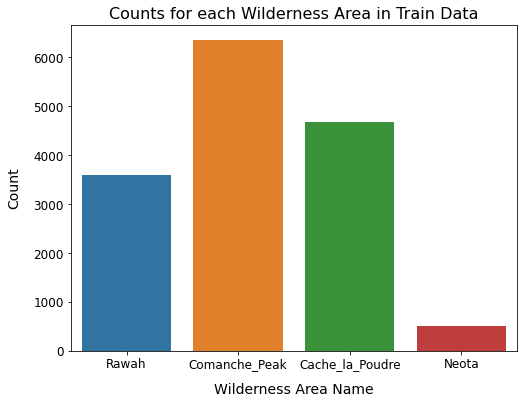

In [13]:
plt.figure(figsize=(8, 6))
ax = sns.countplot(x ='Wilderness_Areas', data = df_engineered)
ax.set_title('Counts for each Wilderness Area in Train Data', fontsize=16)
ax.set_xlabel('Wilderness Area Name', fontsize=14, labelpad=12)
ax.set_ylabel('Count', fontsize=14, labelpad=12)
ax.tick_params(labelsize=12)
plt.show()

### Taking a Closer Look at Variable Relationships
#### How are the variables correlated?

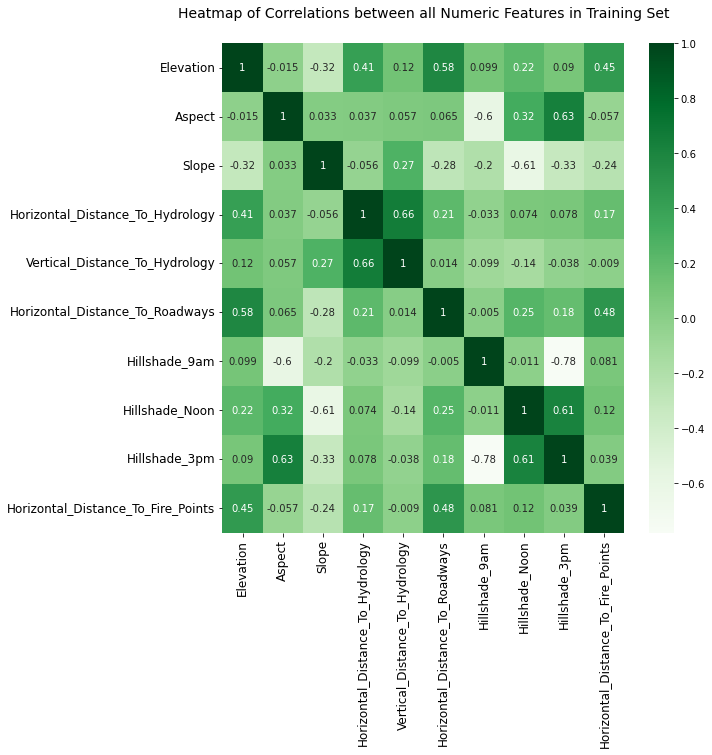

In [14]:
plt.figure(figsize=(9,9))
plt.title('Heatmap of Correlations between all Numeric Features in Training Set', fontsize=14, y=1.04)
plt.tick_params(labelsize=12)
numeric_data = X_all_train.drop(X_all_train.columns[10:54], axis=1) #only measure correlation for numerical features, exclude categorical features like Wilderness_Area, Soil Type, and Cover Type
sns.heatmap(numeric_data.corr(),cbar=True,annot=True,cmap='Greens')
plt.show()

#### Feature Spotlight: Elevation

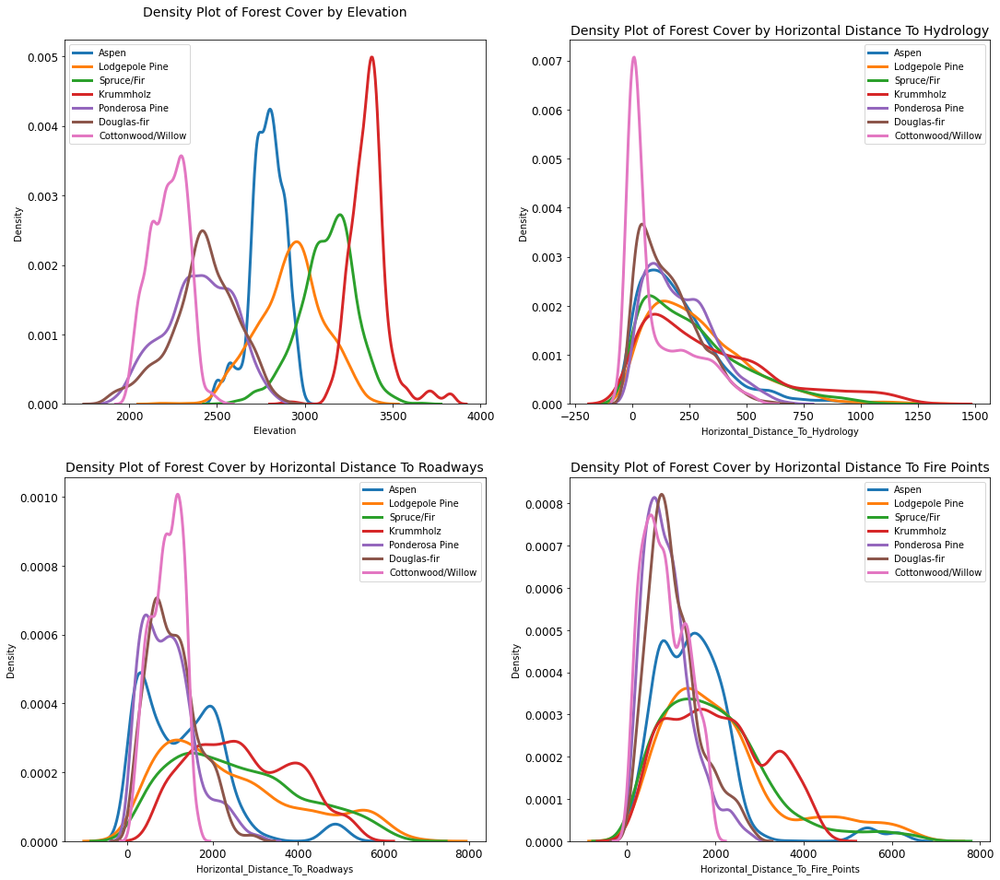

In [22]:
cover_types = list(df_engineered['Cover_Type_Name'].unique())
table = ['Elevation', 'Horizontal_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways', 'Horizontal_Distance_To_Fire_Points']
fig, axes = plt.subplots(2, 2, figsize=(18, 16))
for c in cover_types:
    for t in table:
        subset = df_engineered[df_engineered['Cover_Type_Name'] == c]
        if t == 'Elevation':
            sns.distplot(subset[t], hist = False, kde = True, kde_kws = {'linewidth': 3}, label = c, ax = axes[0, 0]).set_title('Density Plot of Forest Cover by Elevation', fontsize=14, y=1.05)
            axes[0, 0].tick_params(labelsize=12)
            axes[0, 0].legend()
        elif t == 'Horizontal_Distance_To_Hydrology':
            sns.distplot(subset[t], hist = False, kde = True, kde_kws = {'linewidth': 3}, label = c, ax = axes[0, 1]).set_title('Density Plot of Forest Cover by Horizontal Distance To Hydrology', fontsize=14)
            axes[0, 1].tick_params(labelsize=12)
            axes[0, 1].legend()
        elif t == 'Horizontal_Distance_To_Roadways':
            sns.distplot(subset[t], hist = False, kde = True, kde_kws = {'linewidth': 3}, label = c, ax = axes[1, 0]).set_title('Density Plot of Forest Cover by Horizontal Distance To Roadways', fontsize=14)
            axes[1, 0].tick_params(labelsize=12)
            axes[1, 0].legend()
        else:
            sns.distplot(subset[t], hist = False, kde = True, kde_kws = {'linewidth': 3}, label = c, ax = axes[1, 1]).set_title('Density Plot of Forest Cover by Horizontal Distance To Fire Points', fontsize=14)
            axes[1, 1].tick_params(labelsize=12)
            axes[1, 1].legend()

In [7]:
fig = px.scatter_3d(df_engineered, x='Horizontal_Distance_To_Hydrology', 
                    y='Elevation', 
                    z='Vertical_Distance_To_Hydrology',
                    color='Cover_Type_Name', 
                    hover_name='Cover_Type_Name',
                    title='3D Plot Showing Elevation as an Important Feature')

fig.update_layout(scene_aspectmode='manual',
                  scene_aspectratio=dict(x=1, y=1.5, z=1), 
                  margin=dict(l=40, r=40, t=40, b=40))

fig.show()

# plotly.offline.plot(fig, filename='elevation.html', config={'displayModeBar': False})

See plot in fullscreen [here](./elevation.html).

# Experiments

## Baseline Model
We used Logistics Regression with parameters used in class.

(SPEAKER NOTES: HIDE) We chose Logistic Regression for our baseline because it's widely used for a variety of classification problems. It was also a classifier that we were already familiar with. We're using parameters we've used in previous assignments for this class.

In [27]:
# Scale features
scalar_baseline = MinMaxScaler()
scalar_baseline.fit(X_train)
scaled_baseline = scalar_baseline.fit_transform(X_train)
X_train_scaled_baseline = pd.DataFrame(scaled_baseline, columns=X_train.columns)
# Train model
lr_baseline = LogisticRegression(C=5, solver='liblinear', multi_class='auto')
lr_baseline .fit(X_train_scaled_baseline, y_train)
# Evaluate model
y_dev_preds_baseline = lr_baseline.predict(X_dev)

held = metrics.classification_report(y_dev, y_dev_preds_baseline, output_dict= True)
baseline_f1 = round(held['weighted avg']['f1-score']*100, 2)
baseline_acc = round(lr_baseline.score(X_dev, y_dev)*100,2)
print("Baseline Model")
print("--------------")
print("Weighted F1-Score: " + str(baseline_f1) + "%")
print("Accuracy: " + str(baseline_acc) + "%")

Baseline Model
--------------
Weighted F1-Score: 3.93%
Accuracy: 15.04%


## Quick Run of All Supervised Learning Classifiers with Defaults

In [28]:
# Perceptron
perceptron = Perceptron(max_iter=5, random_state=12345)
perceptron.fit(X_train, y_train)
f1_perceptron = round(f1_score(y_dev, perceptron.predict(X_dev), average='weighted') * 100, 2)
print(f1_perceptron, '%')

21.58 %


In [29]:
# KNN
knn = KNeighborsClassifier(n_neighbors = 3)
knn.fit(X_train, y_train)
f1_knn = round(f1_score(y_dev, knn.predict(X_dev), average='weighted') * 100, 2)
print(f1_knn, '%')

78.4 %


In [30]:
# Gaussian Naive Bayes
gaussian = GaussianNB()
gaussian.fit(X_train, y_train)
f1_gaussian = round(f1_score(y_dev, gaussian.predict(X_dev), average='weighted') * 100, 2)
print(f1_gaussian, '%')

52.94 %


In [31]:
# Decision Tree
decision_tree = DecisionTreeClassifier(random_state=12345)
decision_tree.fit(X_train, y_train)
f1_decision_tree = round(f1_score(y_dev, decision_tree.predict(X_dev), average='weighted') * 100, 2)
print(f1_decision_tree, '%')

77.05 %


In [32]:
# Random Forest
random_forest = RandomForestClassifier(n_estimators=100, random_state=12345)
random_forest.fit(X_train, y_train)
f1_random_forest = round(f1_score(y_dev, random_forest.predict(X_dev), average='weighted') * 100, 2)
print(f1_random_forest, '%')

85.18 %


In [33]:
# Logistic Regression
logreg = LogisticRegression(random_state=12345)
logreg.fit(X_train, y_train)
f1_logreg = round(f1_score(y_dev, logreg.predict(X_dev), average='weighted') * 100, 2)
print(f1_logreg, '%')

44.52 %


In [34]:
# Stochastic Gradient Descent (SGD) learning
sgd = linear_model.SGDClassifier(max_iter=5, tol=None, random_state=12345)
sgd.fit(X_train, y_train)
f1_sgd = round(f1_score(y_dev, sgd.predict(X_dev), average='weighted') * 100, 2)
print(f1_sgd, '%')

29.6 %


In [35]:
# Linear SVC (Support Vector Machines)
linear_svc = LinearSVC(random_state=12345)
linear_svc.fit(X_train, y_train)
f1_linear_svc = round(f1_score(y_dev, linear_svc.predict(X_dev), average='weighted') * 100, 2)
print(f1_linear_svc, '%')

24.95 %


### Which basic model did best?

In [36]:
results = pd.DataFrame({
    'Model': ['Support Vector Machines', 'KNN', 'Logistic Regression', 
              'Random Forest', 'Naive Bayes', 'Perceptron', 
              'Stochastic Gradient Decent', 
              'Decision Tree', 'Baseline'],
    'F1-Score': [f1_linear_svc, f1_knn, f1_logreg, 
              f1_random_forest, f1_gaussian, f1_perceptron, 
              f1_sgd, f1_decision_tree, baseline_f1]})
result_df = results.sort_values(by='F1-Score', ascending=False)
result_df = result_df.set_index('F1-Score')
result_df.head(9)

,Model
F1-Score,
85.18,Random Forest
78.40,KNN
77.05,Decision Tree
52.94,Naive Bayes
44.52,Logistic Regression
29.60,Stochastic Gradient Decent
24.95,Support Vector Machines
21.58,Perceptron
3.93,Baseline


## Experiment #1: KNN
### Why KNN?

* non-parametric model, which means it doesn't assume anything about the underlying data
* appropriate for categorical classification

### Data Preprocessing
#### Trying different feature sets
Feature sets:
* all features
* numeric features only
* numeric features scaled
* numeric features normalized

In [37]:
# Data processing, build KNN models, populate knn accuracy lists
# Usual runtime: 3 min

# All features, no data preprocessing
train_accuracies_all = []
dev_accuracies_all = []
k_vals = range(1,15)
for k in k_vals:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    train_accuracies_all.append(knn.score(X_train, y_train))
    dev_accuracies_all.append(knn.score(X_dev, y_dev))

# All numeric features only
train_accuracies_numeric = []
dev_accuracies_numeric = []
numeric_features = ['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points']
for k in k_vals:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train[numeric_features], y_train)
    train_accuracies_numeric.append(knn.score(X_train[numeric_features], y_train))
    dev_accuracies_numeric.append(knn.score(X_dev[numeric_features], y_dev))

# All numeric features scaled
train_accuracies_scaled = []
dev_accuracies_scaled = []
X_train_numeric = X_train[numeric_features]
X_train_numeric_scaled = scale(X_train_numeric)
X_dev_numeric = X_dev[numeric_features]
X_dev_numeric_scaled = scale(X_dev_numeric)
for k in k_vals:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_numeric_scaled, y_train)
    train_accuracies_scaled.append(knn.score(X_train_numeric_scaled, y_train))
    dev_accuracies_scaled.append(knn.score(X_dev_numeric_scaled, y_dev))

# All numeric features normalized
train_accuracies_norm = []
dev_accuracies_norm = []
X_train_numeric = X_train[numeric_features]
X_train_numeric_scaled = normalize(X_train_numeric)
X_dev_numeric = X_dev[numeric_features]
X_dev_numeric_scaled = normalize(X_dev_numeric)
for k in k_vals:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_numeric_scaled, y_train)
    train_accuracies_norm.append(knn.score(X_train_numeric_scaled, y_train))
    dev_accuracies_norm.append(knn.score(X_dev_numeric_scaled, y_dev))

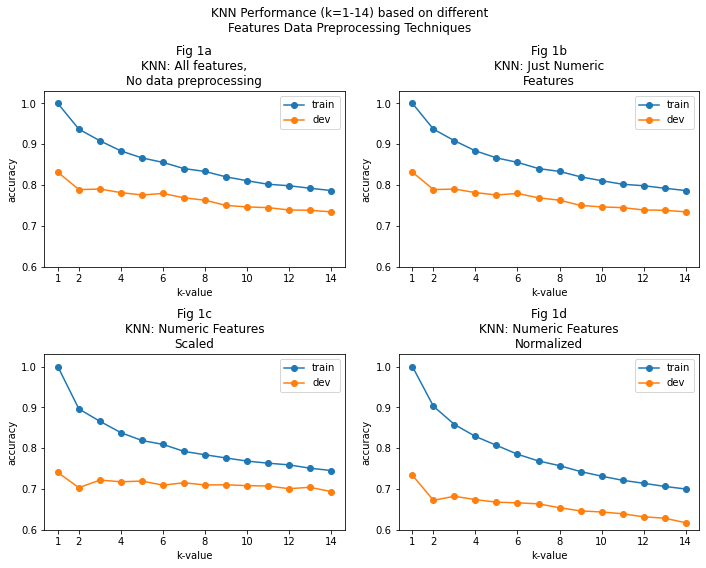

In [46]:
# WHAT THIS CODE CELL DOES: PLOT KNN ACCURACIES BASED ON DATA PREPROCESSING TECHNIQUES
train_accs = np.vstack((train_accuracies_all, train_accuracies_numeric, train_accuracies_scaled, train_accuracies_norm))
dev_accs = np.vstack((dev_accuracies_all, dev_accuracies_numeric, dev_accuracies_scaled, dev_accuracies_norm))
titles = ['Fig 1a\nKNN: All features,\nNo data preprocessing',
    'Fig 1b\nKNN: Just Numeric\nFeatures',
    'Fig 1c\nKNN: Numeric Features\nScaled',
    'Fig 1d\nKNN: Numeric Features\nNormalized']

fig, ax = plt.subplots(2, 2, figsize=(10, 8))
fig.suptitle('KNN Performance (k=1-14) based on different\nFeatures Data Preprocessing Techniques')

list_index = 0
for i in range(2):
    for j in range(2):
        ax[i][j].plot(k_vals, train_accs[list_index], '-o', label='train')
        ax[i][j].plot(k_vals, dev_accs[list_index], '-o', label='dev')
        ax[i][j].set_title(titles[list_index])
        ax[i][j].set_xlabel('k-value')
        ax[i][j].set_xticks([1, 2, 4, 6, 8, 10, 12, 14])
        ax[i][j].set_ylabel('accuracy')
        ax[i][j].set_ylim(0.60,1.03)
        ax[i][j].legend()
        list_index += 1

plt.tight_layout()
plt.show()

Which feature sets yielded the best performance?
* all features vs. numeric features - same performance
* scaling and normalizing numeric features - worse performance

We'll move forward with the second model since it has the best performance and is faster than the first model.

**SPEAKER NOTES (HIDE)**

* Data-preprocessing
    * Equal performance for the model with all features (1a) vs. model with only numeric features (1b). This shows us that KNN is not useful for the categorical data in our particular dataset, even when it's one hot encoded.
    * Scaling numeric features (1c) performs worse, normalizing numeric features (1d) performs even more worse. This seems to indicate that KNN is not capturing important differences between the numeric features.
* Which model to choose?
    * The two leftmost models have the best performance and they perform pretty much the same. We'll move forward with model 1b (KNN: Numeric Features Only) in favor of it running faster and saving on GPU.
* Note on overfitting
    * k=1 has too high accuracy and large error rate, we're overfitting here, so we won't consider k=1 moving forward.

### KNN: Manual Hyperparameter Tuning

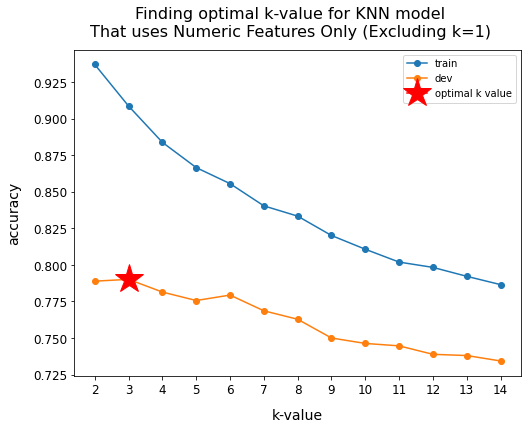

In [49]:
# WHAT THIS CODE CELL DOES: PLOT KNN ACCURACIES BASED ON DATA PREPROCESSING TECHNIQUES
# Usual runtime: 10s

# Remove k=1
train_accuracies_numeric_no1 = train_accuracies_numeric[1:]
dev_accuracies_numeric_no1 = dev_accuracies_numeric[1:]
k_vals_no1 = k_vals[1:]

# Plot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111)
fig.suptitle('Finding optimal k-value for KNN model\nThat uses Numeric Features Only (Excluding k=1)', fontsize=16)
ax.plot(k_vals_no1, train_accuracies_numeric_no1, '-o', label='train')
ax.plot(k_vals_no1, dev_accuracies_numeric_no1, '-o', label='dev')
dev_acc_argmax_index = max(zip(dev_accuracies_numeric_no1, range(len(dev_accuracies_numeric_no1))))[1]
ax.plot(k_vals_no1[dev_acc_argmax_index], dev_accuracies_numeric_no1[dev_acc_argmax_index], marker = '*', markersize=30, c='r', label='optimal k value')
ax.set_xlabel('k-value', fontsize=14, labelpad=12)
ax.set_xticks(k_vals_no1)
ax.tick_params(labelsize=12)
ax.set_ylabel('accuracy', fontsize=14, labelpad=12)
ax.legend()

plt.show()

How I decided on optimal k - High accuracy on training set has a risk of overfitting. To counterbalance this, I want k-value with highest accuracy in held-out set, which is our dev set. This gives me some indication of generalizability since the difference between the train and dev accuracies is smaller for k=3 compared to k=1.

### KNN: Hyperparameter Tuning using GridSearchCV

In [47]:
k_range = list(range(1, 31))
param_grid = dict(n_neighbors=k_range)
grid = GridSearchCV(estimator=KNeighborsClassifier(),
                            param_grid=param_grid, verbose=1, cv=10, scoring='f1_weighted',
                            n_jobs=-1, return_train_score=True)
grid_search=grid.fit(X_train[numeric_features], y_train)
knn_gridcv_f1 = grid_search.best_score_ *100
print("F1-score for our training dataset with GridSearchCV tuning is:\n{:.2f}%".format(knn_gridcv_f1) )
print('Best estimator for GridSearchCV:')
print(grid_search.best_estimator_)

Fitting 10 folds for each of 30 candidates, totalling 300 fits
F1-score for our training dataset with GridSearchCV tuning is:
82.18%
Best estimator for GridSearchCV:
KNeighborsClassifier(n_neighbors=1)


Our concern with overfitting still stands, so we’ll stay with k=1.

### Other things we tried
* Feature reduction experiment - tried different combinations of numeric features, didn't help performance much
* Dropped last one-hot encoded feature (i.e. Wilderness_Area4 and SoilType_40) - didn't help performance much

* Other things I did **(SPEAKER NOTES - HIDE)**:
    * **Feature reduction experiment (numeric features only)** - Did process of elimination to see if, out of all numeric features, taking away one numeric feature would drastically lower accuracy, indicating high influence of that feature on cover type. Didn't find any feature that met that critera. So the relationships between the numeric features are important to capture by including all numeric features.
    * Checked if one-hot encoded features had any significance in accuracy by using strategies like dropping last one-hot encoded feature (e.g. Wilderness_Area4, SoilType_40), but they all still had low influence on accuracy with KNN.

### Our Final KNN Model

Based on our findings and reasoning from above, our final KNN model will have only numeric features and k=3.

In [50]:
# Final KNN Model - numeric features only, k=3
numeric_features = ['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points']
knn_final_model = KNeighborsClassifier(n_neighbors=3)
knn_final_model.fit(X_train[numeric_features], y_train)
y_dev_preds_knn = knn_final_model.predict(X_dev[numeric_features])
f1_knn_final = round(f1_score(y_dev, y_dev_preds_knn, average='weighted') * 100, 2)
print('Final KNN Model')
print('---------------')
print('Dev f1-score: ' + str(f1_knn_final) + '%')

Final KNN Model
---------------
Dev f1-score: 78.4%


### KNN Conclusion: How good is KNN for our dataset?
* f1-scores are just okay
* KNN performance gets worse as k increases
* other classifiers might be a better fit for our dataset

**Speaker Notes - HIDE**
* The f1 scores we're getting with KNN aren't bad, but they aren't stellar either.
* The KNN performance gets worse as k increases, so perhaps KNN is too simple of an algorithm for our dataset and isn't able to capture the complexity of our dataset like relationships of our categorical features?
* Other classifiers might be a better fit for our dataset.

## Experiment #2: Random Forest

### Why Random Forest?

* Less prone to overfitting because it's voting on many decision trees.

### Basic RF Model with Default Hyperparameters:
#### Train on X_train, then evaluate on X_dev

In [51]:
basic_random_forest = RandomForestClassifier(random_state=12345) # num trees in forest n_estimators=100 by default
basic_random_forest.fit(X_train, y_train)
y_predict_rf = basic_random_forest.predict(X_dev)
f1_rf_basic = round(f1_score(y_dev, y_predict_rf, average='weighted') * 100, 2)
print('Basic Random Forest Dev f1-score: ' + str(f1_rf_basic) + '%')

Basic Random Forest Dev f1-score: 85.18%


#### Use K-Fold Cross Validation on X_all_train - for more generalizability
* Divide data into 10 folds
* Train on 9 folds
* Evaluate on 1 fold
* Repeat until all folds each served as the evaluation fold

**Speaker Notes - HIDE**
K-Fold Cross Validation randomly splits training data into K subsets or folds. Here we use k=10, which means that our random forest model is trained and evaluated 10 times, using a different fold for evaluation everytime, while it will be trained on the remaining 9 folds (i.e. train on 9 and eval on 1). K-Fold Cross Validation repeats this process until every fold acted as an evaluation fold once. Therefore we will get 10 scores. Because K-Fold CV trains and evaluates on different shuffles/partitions of the data, we can just do it on X_all_train (X_train + X_dev). This gives us a better sense of how random forest would perform on different shuffles of the data, which would make the model more generalizable.

In [58]:
rf_cv_scores = cross_val_score(basic_random_forest, X_train, y_train, cv=10, scoring='f1_weighted')
print('Running K-Fold Cross Validation on Basic Random Forest Model')
print('------------------------------------------------------------')
print('F1-Scores: ', rf_cv_scores)
print('Mean: ', rf_cv_scores.mean())
print('Standard Deviation: ', rf_cv_scores.std())

Running K-Fold Cross Validation on Basic Random Forest Model
------------------------------------------------------------
F1-Scores:  [0.83768573 0.84113152 0.84367358 0.83005668 0.85008991 0.85209387
 0.84150782 0.83628688 0.85173171 0.83321293]
Mean:  0.841747061130879
Standard Deviation:  0.007323284145837317


### Data preprocessing

#### Feature Importance

In [52]:
feature_importances = pd.DataFrame({'feature' : X_train.columns, 'importance' : np.round(basic_random_forest.feature_importances_, 3)})
feature_importances = feature_importances.sort_values('importance', ascending=False).set_index('feature')

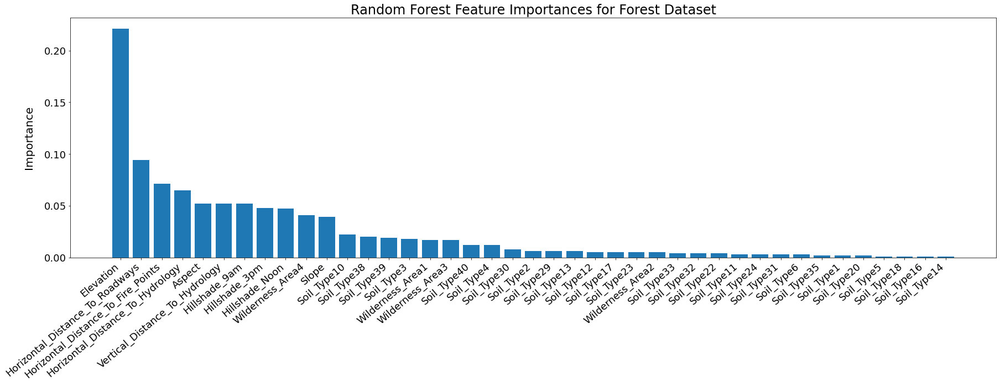

In [65]:
importances = feature_importances.iloc[:41] # only plot importances > 0
fig = plt.figure(figsize=(30, 8))
ax = fig.add_subplot(111)
plt.bar(importances.index, importances['importance'])
plt.title('Random Forest Feature Importances for Forest Dataset', fontsize=24)
plt.setp(ax.get_xticklabels(), rotation=40, horizontalalignment='right')
plt.ylabel('Importance', fontsize=20, labelpad=18)
plt.tick_params(labelsize=18)
plt.show()

### Hyperparameter Tuning with GridSearchCV

In [55]:
param_grid = { "criterion" : ["gini", "entropy"], "max_features" : [10, 17, 30], "n_estimators": [100, 500, 600]}
rf_gridcv = RandomForestClassifier(random_state=12345)
rf_clf = GridSearchCV(estimator=rf_gridcv, param_grid=param_grid, cv=10, scoring='f1_weighted')
rf_clf.fit(X_all_train, y_all_train)
print('Best estimators for GridSearchCV with Random Forest: ', rf_clf.best_estimator_)

Best estimators for GridSearchCV with Random Forest:  RandomForestClassifier(max_features=17, n_estimators=500, random_state=12345)


In [ ]:
random_forest_model_gridcv = RandomForestClassifier(n_estimators=500, max_features=17, random_state=12345)
grid_cv_scores_reduced_f1 = cross_val_score(random_forest_model_gridcv, X_all_train, y_all_train, cv=10, scoring='f1_weighted')
print('Random Forest using GridSearchCV parameters and 10-fold Cross Validation F1-scoring:')
print('------------------------------------------------------------------------------------')
print('Scores: ', grid_cv_scores_reduced_f1)
print('Mean: ', grid_cv_scores_reduced_f1.mean())
print('Standard Deviation: ', grid_cv_scores_reduced_f1.std())

Random Forest using GridSearchCV parameters and 10-fold Cross Validation F1-scoring:
------------------------------------------------------------------------------------
Scores:  [0.86525833 0.86599392 0.87224717 0.86291393 0.87367766 0.85003772
 0.85682383 0.86251626 0.87403665 0.86356041]
Mean:  0.8647065878575484
Standard Deviation:  0.007162336997216923


Random Forest with hyperparameters from GridSearchCV increases the cross validation score by 2%, which is pretty significant.

### Our Final Random Forest Model

In [66]:
random_forest_final_model = RandomForestClassifier(n_estimators=500, max_features=17, random_state=12345)
random_forest_final_model.fit(X_train, y_train)
y_dev_preds_rf = random_forest_final_model.predict(X_dev)
f1_rf_final = round(f1_score(y_dev, y_dev_preds_rf, average='weighted') * 100, 2)
print('Final Random Forest Model')
print('-------------------------')
print('Dev F1-score: ' + str(f1_rf_final) + '%')

Final Random Forest Model
-------------------------
Dev F1-score: 84.98%


### RF Conclusion: How good is Random Forest for our dataset?
* So far, random forest performs the best and has the highest f1-score.
* This makes sense given the ensemble structure of the algorithm and its ability to discern best fits based on feature subsets.

## Experiment #3: Multinomial Logistic Regression

### Why Logistic Regression?
* When ever you think of algorthims regression of some sort comes to mind first and then you build to more complex or specalized options. 
* Works with catagorical features long as they are one hot encoded
* Logistc Regression can handle sparse data

### Manual Hyperparameter Tuning
After running our base line model, we chose some parameters intuitively:
* `class_weight='balanced'` - class_weight was set to “balanced” because we felt that it would help with the data imbalances.
* `max_iter=500` - We tried several values for max_iter , and the smallest value that would converge was 500
* `solver='newton_cg'` - We chose solver = “newton_cg” because it was recommended for multiclass problems and did not immediately need preprocessing.
* `random_state=1234` - We tried to keep random states 1234 consistent throughout all of the models
* `muti_class='auto` - we used muti_class= “auto” because the model should choose multinomial on its own with out direction

In [67]:
lr_manual1 =  LogisticRegression(class_weight='balanced', max_iter=500, solver='newton-cg', random_state=1234, multi_class="auto" ) #run the model
lr_manual1.fit(X_train, y_train)
lr_manual1_y_preds = lr_manual1.predict(X_dev)
lr_manual1_f1 = f1_score(y_dev, lr_manual1_y_preds, average='weighted')
lr_manual1_f1 = round(lr_manual1_f1 * 100, 2)
print("Logistic Regression with Manual Hyperparameter Tuning")
print("-----------------------------------------------------")
print("Dev f1-score: " + str(lr_manual1_f1) + "%")

Logistic Regression with Manual Hyperparameter Tuning
-----------------------------------------------------
Dev f1-score: 69.47%


### Additional EDA to Inform Hyperparameter Tuning

#### Which categoricals matter?
Hill shade is an incdental measure of light, based on elevation and geographic shape: <a href="http://www.geography.hunter.cuny.edu/~jochen/gtech361/lectures/lecture11/concepts/hillshade.ht">see article</a>

Soil types if they have a relatioship are related to Elevation, Wilderness Type, Hydrology, Roadways. Based on some additonal research hillshade is a funtion of landmass and topographic standard. Connected to Aspect. I think we can drop soil types as long as wilderness is kept. 

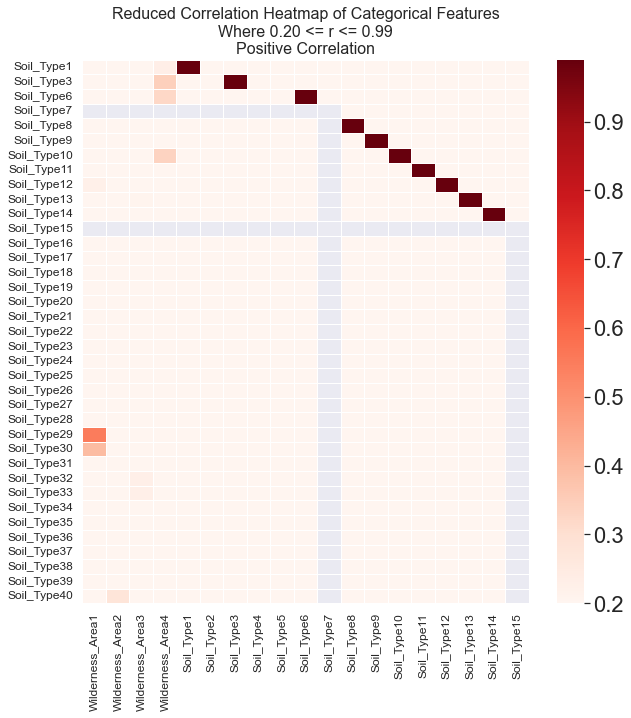

In [75]:
# TODO : HIDE CODE

# source: https://stackoverflow.com/questions/65981361/seaborn-heatmap-display-the-heatmap-only-if-values-are-above-given-threshold

categorical_data = X_train.iloc[:,10:54]
labels = categorical_data.columns

#your correlation array
corr = categorical_data.corr().to_numpy()
corr = np.tril(corr)
#conditions for filtering val_min <= r <= val_max
val_min = 0.2
val_max = 0.99

#plotting starts here
sns.set(font_scale=2)
#two axis objects just for comparison purposes
fig, ax_cat = plt.subplots(1, 1, figsize=(10,10))

#delete columns where all elements do not fulfill the conditions
ind_x,  = np.where(np.all(np.logical_or(corr<val_min, corr>val_max), axis=0))
corr = np.delete(corr, ind_x, 1)
#update x labels
map_labels_x = [item for i, item in enumerate(labels) if i not in ind_x]
    
#now the same for rows 
ind_y, = np.where(np.all(np.logical_or(corr<val_min, corr>val_max), axis=1))
corr = np.delete(corr, ind_y, 0)
#update y labels
map_labels_y = [item for i, item in enumerate(labels) if i not in ind_y]

#plot heatmap
cat_heatmap = sns.heatmap(corr,
    xticklabels=map_labels_x,
    yticklabels=map_labels_y,
    vmin=val_min,
    vmax=val_max,
    cmap='Reds',
    linewidths=1.0,
    ax=ax_cat)
# cat_heatmap = sns.heatmap(corr,
#     xticklabels=map_labels_x,
#     yticklabels=map_labels_y,
#     vmin=val_min,
#     vmax=val_max,
#     cmap='Reds',
#     linewidths=1.0,
#     linecolor="grey", ax=ax_cat)

cat_heatmap.set_title('Reduced Correlation Heatmap of Categorical Features\nWhere %.2f <= r <= %.2f\nPositive Correlation' %(val_min, val_max), fontsize=16)
cat_heatmap.tick_params(labelsize=12)

plt.show()

Looking at the correlation map between the categorical soil type as a function wilderness type, there is the possibility that the strengths are erroneous, but there is also the possibility that a relationship exists. Let’s look at the counts of soil type by wilderness to see.

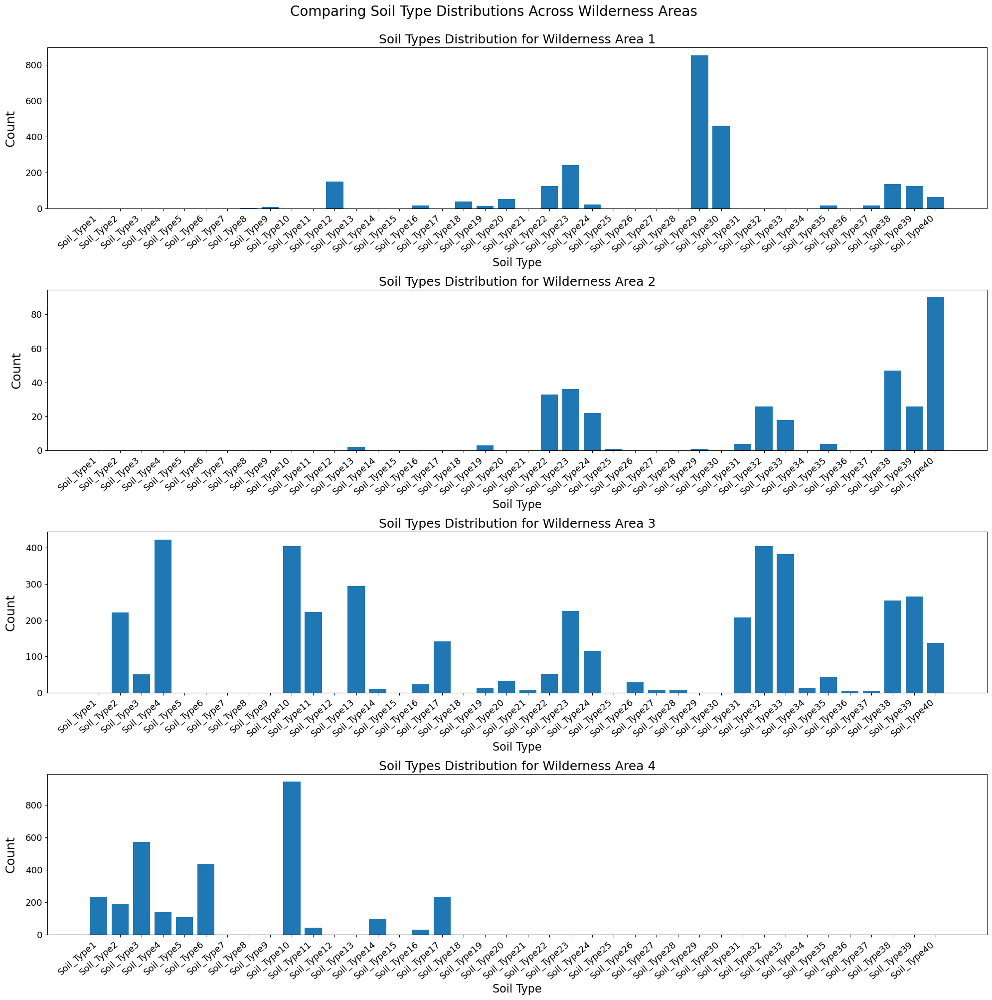

In [91]:
# TODO : HIDE CODE ONLY

wilderness_areas = ['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4']
plt.rcParams.update(plt.rcParamsDefault)
fig, ax = plt.subplots(4, 1, figsize=(20, 20))
fig.suptitle('Comparing Soil Type Distributions Across Wilderness Areas ', fontsize=20, y=1.00005)
for i in range(4):
    # get counts for current Wilderness_Area
    wa = X_train[X_train[wilderness_areas[i]] == 1]
    wa = wa.iloc[:,14:54] # only get soil type columns
    wa_series = wa.sum(axis=0)
    soil_type_labels_wa = wa_series.index
    soil_type_counts_wa = wa_series.values
    # plot
    ax[i].set_title('Soil Types Distribution for Wilderness Area ' + str(i+1), fontsize=18)
    ax[i].set_xlabel('Soil Type', fontsize=16)
    ax[i].set_ylabel('Count', fontsize=18, labelpad=12)
    ax[i].bar(soil_type_labels_wa, soil_type_counts_wa)
    plt.setp(ax[i].get_xticklabels(), rotation=40, horizontalalignment='right')
    ax[i].tick_params(labelsize=13)
plt.tight_layout()
plt.show()

The signal is so mixed in the counts of soil type by wilderness. And strong signals such as soil type 29 in wilderness area 1 don’t line up with what is expected based on  the strengths represented in our multiple iterations of correlation maps. Given that, let’s try to drop all of the soil types since their data is sparse and they add dimensionality.   

We will also attempt to drop hillshade based on some external research that suggests that hillshade is a calculated variable based on sun position (aspect) and physical  topographic features.

### Data Preprocessing
Data pre processing, based on some additional EDA, and the fact that lostic regession wants the features to be int64 I will take out all of the soil types because of their relationship to Wilderness type; and the hillshade noon, 9am and 3am variables because of their relationship to aspect.

Let's see if the model will improve if we drop the following feature sets:
* Drop selected soil features
* Drop selected hillshade features
* Drop selected soil and selected hillshade features

In [8]:
# TODO : HIDE CODE
no_soil=X_train.drop(['Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 
                                                      'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 
                                                      'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 
                                      'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 
                                      'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 
                                      'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33' , 'Soil_Type34', 'Soil_Type35',   'Soil_Type36', 
                                      'Soil_Type37', 'Soil_Type38', 'Soil_Type39'], axis=1)

dev_no_soil = X_dev.drop(['Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 
                                                      'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 
                                                      'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 
                                      'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 
                                      'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 
                                      'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33' , 'Soil_Type34', 'Soil_Type35',   'Soil_Type36', 
                                      'Soil_Type37', 'Soil_Type38', 'Soil_Type39'], axis=1)


no_soil_hill=X_train.drop(['Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 
                                                      'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 
                                                      'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 
                                      'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 
                                      'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 
                                      'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33' , 'Soil_Type34', 'Soil_Type35',   'Soil_Type36', 
                                      'Soil_Type37', 'Soil_Type38', 'Soil_Type39',  'Hillshade_9am',	'Hillshade_Noon',	'Hillshade_3pm'], axis=1)

dev_no_soil_hill= X_dev.drop(['Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 
                                                      'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 
                                                      'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 
                                      'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 
                                      'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 
                                      'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33' , 'Soil_Type34', 'Soil_Type35',   'Soil_Type36', 
                                      'Soil_Type37', 'Soil_Type38', 'Soil_Type39',  'Hillshade_9am',	'Hillshade_Noon',	'Hillshade_3pm'], axis=1)



no_hill=X_train.drop(['Hillshade_9am',	'Hillshade_Noon',	'Hillshade_3pm'], axis=1)

dev_no_hill=X_dev.drop(['Hillshade_9am',	'Hillshade_Noon',	'Hillshade_3pm'], axis=1)

In [9]:
# Model 1: Dropped selected hill features
print('Model 1: Dropped selected hill features')
print('---------------------------------------')
lr_cat_drop1 = LogisticRegression(class_weight='balanced', max_iter=500, solver='newton-cg', random_state=1234, multi_class="auto")
lr_cat_drop1.fit(no_hill, y_train)
lr_cat_drop1_preds = lr_cat_drop1.predict(dev_no_hill)
print(classification_report(y_dev, lr_cat_drop1_preds))

# Model 2: Dropped selected hill and selected soil features
print('Model 2: Dropped selected hill and selected soil features')
print('---------------------------------------------------------')
lr_cat_drop2 = LogisticRegression(class_weight='balanced', max_iter=500, solver='newton-cg', random_state=1234, multi_class="auto")
lr_cat_drop2.fit(no_soil_hill, y_train)
lr_cat_drop2_preds = lr_cat_drop2.predict(dev_no_soil_hill)
print(classification_report(y_dev, lr_cat_drop2_preds))

# Model 3: Dropped selected soil features
print('Model 3: Dropped selected soil features')
print('---------------------------------------')
lr_cat_drop3 = LogisticRegression(class_weight='balanced', max_iter=500, solver='newton-cg', random_state=1234, multi_class="auto")
lr_cat_drop3.fit(no_soil, y_train)
lr_cat_drop3_preds = lr_cat_drop3.predict(dev_no_soil)
print(classification_report(y_dev, lr_cat_drop3_preds))

Model 1: Dropped selected hill features
---------------------------------------
              precision    recall  f1-score   support

           1       0.64      0.67      0.65       330
           2       0.58      0.49      0.53       346
           3       0.64      0.54      0.59       366
           4       0.77      0.87      0.82       321
           5       0.67      0.74      0.71       344
           6       0.59      0.64      0.61       349
           7       0.91      0.89      0.90       364

    accuracy                           0.69      2420
   macro avg       0.69      0.69      0.69      2420
weighted avg       0.69      0.69      0.69      2420

Model 2: Dropped selected hill and selected soil features
---------------------------------------------------------
              precision    recall  f1-score   support

           1       0.63      0.61      0.62       330
           2       0.62      0.44      0.51       346
           3       0.51      0.46      0.49 

Spot removing and partial removing Hillshade and soil variables hurt the model's prediction power. Therefore we'll be keeping all features for our Logistic Regression model.

### Trying PCA

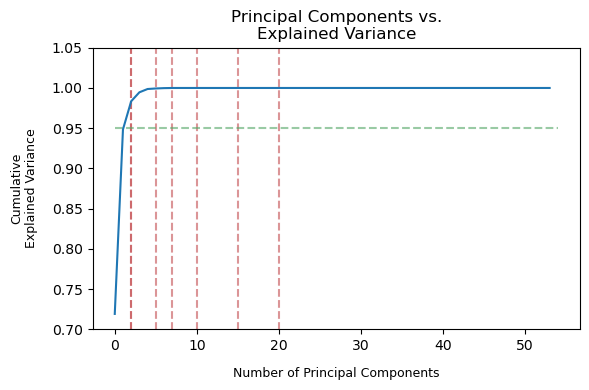

In [119]:
#citation: https://dwbi1.wordpress.com/2021/04/16/logistic-regression-with-pca-in-python/
pca = PCA(random_state=1234)
pca.fit(X_train)
explained_variance = np.cumsum(pca.explained_variance_ratio_)
y_max_val = 1.05
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax.plot(explained_variance)
ax.vlines(x=2, ymax=y_max_val, ymin=0, colors='r', linestyles='--', alpha=0.6)
ax.vlines(x=5, ymax=y_max_val, ymin=0, colors='r', linestyles='--', alpha=0.6)
ax.vlines(x=2, ymax=y_max_val, ymin=0, colors='r', linestyles='--', alpha=0.6)
ax.vlines(x=7, ymax=y_max_val, ymin=0, colors='r', linestyles='--', alpha=0.6)
ax.vlines(x=10, ymax=y_max_val, ymin=0, colors='r', linestyles='--', alpha=0.6)
ax.vlines(x=15, ymax=y_max_val, ymin=0, colors='r', linestyles='--', alpha=0.6)
ax.vlines(x=20, ymax=y_max_val, ymin=0, colors='r', linestyles='--', alpha=0.6)
ax.hlines(y=0.95, xmax=54, xmin=0, colors='g', linestyles='--', alpha=0.6)
ax.set_title('Principal Components vs.\nExplained Variance', fontsize=12)
ax.set_xlabel('Number of Principal Components', fontsize=9, labelpad=10)
ax.set_ylabel('Cumulative\nExplained Variance', fontsize=9, labelpad=10)
ax.set_ylim(0.7, y_max_val)
plt.tight_layout()
plt.show()

We tried some initial PCA exploration, but after viewing our visualization of principle components compared to the amount of cumulative explained variance, it was clear something was off. The best number of principle components was 1. We re-reviewed PCA and because our data is categorical, it does not map well to “sequences of direction vectors that differ on basis of best-fit lines” (<a href="https://www.analyticsvidhya.com/blog/2021/04/principal-component-analysis-introduction-and-practice-problem/">source</a>). Since at the most elemental level our data likely has a discrete probability distribution. We stopped here and moved on to trying to hyper tune the model.

### Hyperparameter Tuning with GridSearchCV
Running GridSearchCV yielded the following optimal parameters:
* `C=0.7` - regularization strength
* `class_weight='balanced'`
* `max_iter=200` - higher values of max_iter increase the possibility of overfitting
* `penalty='l1'` - adds an l1 penalty term, which limits the size of the coefficients, reducing possibility of overfitting
* `solver='saga'` - saga works for multiclass problems, has faster convergence on features with approx the same scale, which is why we do the MinMaxScaling beforehand
* `random_state=1234`

To build the GridSearchCV parameter gridm we refenced the SciKitLearn Documentation, a few articles about logistics regression tuning, bits we had experimented with in class, and the warnings that propagated during testing. Commented out is the full test grid, running in this report is an edited grid for speed.
See sources 
<a href="https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html">here</a>,
<a href="https://medium.com/analytics-vidhya/how-to-improve-logistic-regression-b956e72f4492">here</a>,
<a href="https://www.kaggle.com/code/enespolat/grid-search-with-logistic-regression/notebook">here</a>, and
<a href="https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html">here</a>.

In [97]:
# Original parameter grid inspired by research from scikit-learn documentation
# param_grid_lr = {
#     'max_iter': [20, 50, 100, 200, 500, 1000],                      
#     'solver': ['newton-cg', 'lbfgs', 'sag', 'saga'],   
#     'class_weight': ['balanced'],
#     "penalty": ["l1","l2","None"],
#     "C": [.0001 ,.1, .2, .3, .5, .7,] # given by project 3 
# }
param_grid_lr = {
    'max_iter': [20, 200, 500],                      
    'solver': ['lbfgs', 'saga'],   
    'class_weight': ['balanced'],
    "penalty": ["l1","l2","None"],
    "C": [0.3, 0.5, 0.7]
}
scaler = MinMaxScaler(feature_range = (0,1))
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_dev_scaled = scaler.transform(X_dev)
logModel_grid = GridSearchCV(estimator=LogisticRegression(random_state=1234), 
                            param_grid=param_grid_lr, verbose=1, cv=10,
                            n_jobs=-1, return_train_score=True)
logModel_grid.fit(X_train_scaled, y_train)

Fitting 10 folds for each of 54 candidates, totalling 540 fits

Results of GridSearchCV on Logistic Regression
------------------------------------------------
Best estimator:  LogisticRegression(C=0.7, class_weight='balanced', max_iter=200, penalty='l1',
                   random_state=1234, solver='saga')


Classification report:
              precision    recall  f1-score   support

           1       0.66      0.68      0.67       330
           2       0.63      0.51      0.57       346
           3       0.65      0.48      0.55       366
           4       0.78      0.89      0.83       321
           5       0.69      0.78      0.73       344
           6       0.59      0.68      0.64       349
           7       0.90      0.90      0.90       364

    accuracy                           0.70      2420
   macro avg       0.70      0.71      0.70      2420
weighted avg       0.70      0.70      0.70      2420



### Other things we tried
We tried LogisticRegressionCV but it was slower and did not produce better predictive power nor was its documentation as robust as GridSearchCV so it has been excluded.

### Our Final Logistic Regression Model

In [99]:
scaler = MinMaxScaler(feature_range = (0,1))
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_dev_scaled = scaler.transform(X_dev)
log_reg_final_model = LogisticRegression(C=0.7, class_weight='balanced', max_iter=200, penalty='l1',
                   random_state=1234, solver='saga')
lr_final_cv_f1 = cross_val_score(log_reg_final_model, X_all_train, y_all_train, cv=10, scoring='f1_weighted') # TODO: take out if takes too long
print('CV Scores: ', lr_final_cv_f1)
print('CV Mean: ', lr_final_cv_f1.mean())
print('CV Standard Deviation: ', lr_final_cv_f1.std())
log_reg_final_model.fit(X_train_scaled, y_train)
y_dev_predictions_lr_final = log_reg_final_model.predict(X_dev_scaled)
f1_lr_final = round(f1_score(y_dev, y_dev_predictions_lr_final, average='weighted') * 100, 2)
print('Dev F1-score: ' + str(f1_lr_final) + '%')

CV Scores:  [0.52029536 0.52395768 0.5470909  0.51803427 0.52791337 0.51379128
 0.52558093 0.48401385 0.52056938 0.5401178 ]
CV Mean:  0.5221364820047266
CV Standard Deviation:  0.015938177888647313
Dev F1-score: 69.78%


### LR Conclusion: How good is Logistic Regression for our dataset?
On this particular data set logistic regression performs just “average”. Intuition and experimentation lead us to believe this is because the regression is struggling to interpret the signals in the soil type and the hillside variables. Colloquially the model “can tell” they are important variables but does know exactly how inform the final decision.

# Conclusions drawn as a result of the experiments

## Comparing our Models

### Now, let's run all of our final models on the truly unseen data: the test set.

In [108]:
# KNN
y_test_preds_knn = knn_final_model.predict(X_test[numeric_features])
f1_knn_final_test = round(f1_score(y_test, y_test_preds_knn, average='weighted') * 100, 2)
# Random Forest
y_test_preds_rf = random_forest_final_model.predict(X_test)
f1_rf_final_test = round(f1_score(y_test, y_test_preds_rf, average='weighted') * 100, 2)
# Logistic Regression
X_test_scaled = scaler.transform(X_test)
y_test_preds_lr = log_reg_final_model.predict(X_test_scaled)
f1_lr_final_test = round(f1_score(y_test, y_test_preds_lr, average='weighted') * 100, 2)

### Which of our final models performed best on the test set?

In [109]:
final_model_f1_results = pd.DataFrame({
    'Model': ['KNN', 'Random Forest', 'Logistic Regression'],
    'F1-Score': [f1_knn_final_test, f1_rf_final_test, f1_lr_final_test]})
final_result_df = final_model_f1_results.sort_values(by='F1-Score', ascending=False)
final_result_df = final_result_df.set_index('F1-Score')
display(final_result_df)

,Model
F1-Score,
85.46,Random Forest
80.55,KNN
69.50,Logistic Regression


### Error Analysis

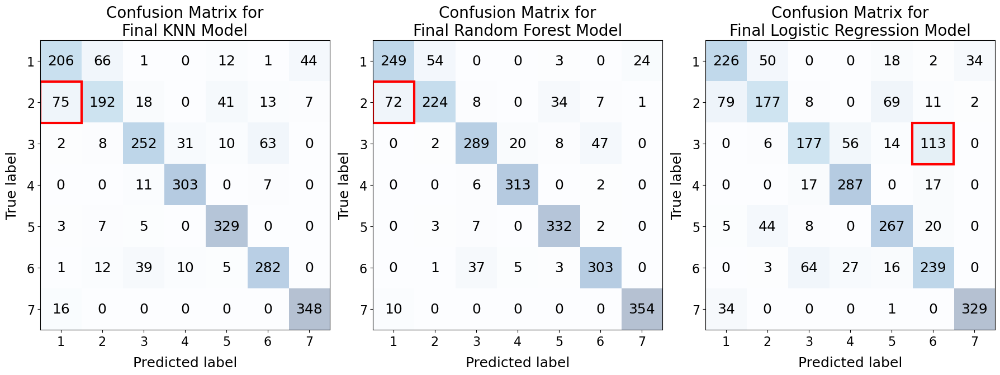

In [133]:
knn_conf_matrix = confusion_matrix(y_dev, y_dev_preds_knn)
rf_conf_matrix = confusion_matrix(y_dev, y_dev_preds_rf)
lf_conf_matrix = confusion_matrix(y_dev, y_dev_predictions_lr_final)

def highlight_cell(x, y, ax, **kwargs):
    rect = plt.Rectangle((x-0.5, y-0.5), 1, 1, fill=False, **kwargs)
    ax.add_patch(rect)
    return rect

fig, ax = plt.subplots(1, 3, figsize=(18, 18))
ax[0].matshow(knn_conf_matrix, cmap=plt.cm.Blues, alpha=0.3)
for i in range(knn_conf_matrix.shape[0]):
    for j in range(knn_conf_matrix.shape[1]):
        ax[0].text(x=j, y=i, s=knn_conf_matrix[i, j], va='center', ha='center', fontsize=18)
ax[0].xaxis.set_ticks_position("bottom")
ax[0].xaxis.set_ticklabels(['', '1', '2', '3', '4', '5', '6', '7', ''])
ax[0].yaxis.set_ticklabels(['', '1', '2', '3', '4', '5', '6', '7', ''])
ax[0].tick_params(labelsize=16)
ax[0].set_title('Confusion Matrix for\nFinal KNN Model', fontsize=20)
ax[0].set_xlabel('Predicted label', fontsize=18, labelpad=10)
ax[0].set_ylabel('True label', fontsize=18, labelpad=10)

highlight_cell(0, 1, ax=ax[0], color='red', linewidth=3)

ax[1].matshow(rf_conf_matrix, cmap=plt.cm.Blues, alpha=0.3)
for i in range(rf_conf_matrix.shape[0]):
    for j in range(rf_conf_matrix.shape[1]):
        ax[1].text(x=j, y=i, s=rf_conf_matrix[i, j], va='center', ha='center', fontsize=18)
ax[1].xaxis.set_ticks_position("bottom")
ax[1].xaxis.set_ticklabels(['', '1', '2', '3', '4', '5', '6', '7', ''])
ax[1].yaxis.set_ticklabels(['', '1', '2', '3', '4', '5', '6', '7', ''])
ax[1].tick_params(labelsize=16)
ax[1].set_title('Confusion Matrix for\nFinal Random Forest Model', fontsize=20)
ax[1].set_xlabel('Predicted label', fontsize=18, labelpad=10)
ax[1].set_ylabel('True label', fontsize=18, labelpad=10)

highlight_cell(0, 1, ax=ax[1], color='red', linewidth=3)

ax[2].matshow(lf_conf_matrix, cmap=plt.cm.Blues, alpha=0.3)
for i in range(lf_conf_matrix.shape[0]):
    for j in range(lf_conf_matrix.shape[1]):
        ax[2].text(x=j, y=i, s=lf_conf_matrix[i, j], va='center', ha='center', fontsize=18)
ax[2].xaxis.set_ticks_position("bottom")
ax[2].xaxis.set_ticklabels(['', '1', '2', '3', '4', '5', '6', '7', ''])
ax[2].yaxis.set_ticklabels(['', '1', '2', '3', '4', '5', '6', '7', ''])
ax[2].tick_params(labelsize=16)
ax[2].set_title('Confusion Matrix for\nFinal Logistic Regression Model', fontsize=20)
ax[2].set_xlabel('Predicted label', fontsize=18, labelpad=10)
ax[2].set_ylabel('True label', fontsize=18, labelpad=10)

highlight_cell(5, 2, ax=ax[2], color='red', linewidth=3)

plt.tight_layout()
plt.show()

Most common misclassification **(Speaker Notes - HIDE)**
* Which cover types are being predicted incorrectly for each model? Is there a pattern to these incorrect predictions? Could this be due to imbalances in data?
* We see a pattern bewtween incorrect predictions across our models. As you can see from above, both KNN and Random Forest models most often misclassifies cover type 1 (Spruce/Fir) with 2 (Lodgepole Pine). That is, the mistake they both make the most is classifying a forest patch as Spruce/Fir when it's really Lodgepole Pine.
* Could this be due to the data imbalance? Let's check.

### Example of Data Imbalance

##### Gather Incorrect Predictions

In [136]:
# KNN Incorrects
X_dev_all_features_knn = X_dev.copy()
X_dev_all_features_knn['Predicted_Cover'] = y_dev_preds_knn
X_dev_all_features_knn['Actual_Cover'] = y_dev
incorrect_knn_df = X_dev_all_features_knn[X_dev_all_features_knn['Actual_Cover']!=X_dev_all_features_knn['Predicted_Cover']]
incorrect_knn_df = incorrect_knn_df[incorrect_knn_df['Actual_Cover']==2]
incorrect_knn_df = incorrect_knn_df[incorrect_knn_df['Predicted_Cover']==1]
# Random Forest Incorrects
X_dev_all_features_rf = X_dev.copy()
X_dev_all_features_rf['Predicted_Cover'] = y_dev_preds_rf
X_dev_all_features_rf['Actual_Cover'] = y_dev
incorrect_rf_df = X_dev_all_features_rf[X_dev_all_features_rf['Actual_Cover']!=X_dev_all_features_rf['Predicted_Cover']]
incorrect_rf_df = incorrect_rf_df[incorrect_rf_df['Actual_Cover']==2]
incorrect_rf_df = incorrect_rf_df[incorrect_rf_df['Predicted_Cover']==1]
# Logistic Regression Incorrects
X_dev_all_features_lr = X_dev.copy()
X_dev_all_features_lr['Predicted_Cover'] = y_dev_preds_rf
X_dev_all_features_lr['Actual_Cover'] = y_dev
incorrect_lr_df = X_dev_all_features_lr[X_dev_all_features_lr['Actual_Cover']!=X_dev_all_features_lr['Predicted_Cover']]
incorrect_lr_df = incorrect_lr_df[incorrect_lr_df['Actual_Cover']==2]
incorrect_lr_df = incorrect_lr_df[incorrect_lr_df['Predicted_Cover']==1]

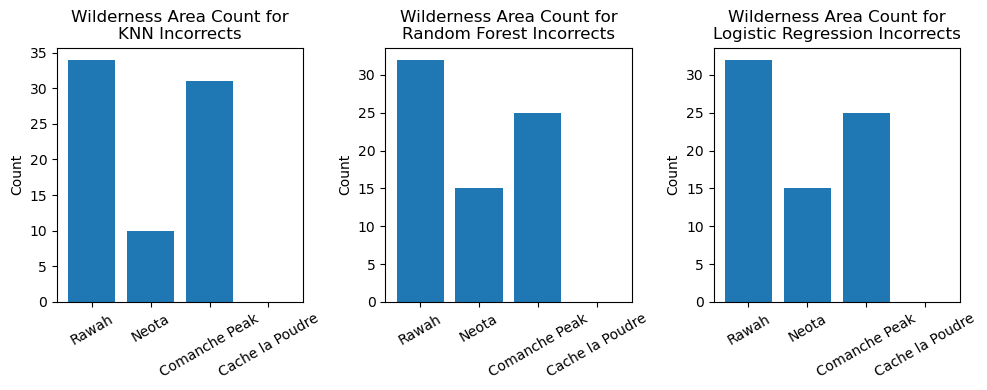

In [147]:
fig, ax = plt.subplots(1, 3, figsize=(10, 4))
# Plot KNN Incorrect Rows
counts = [np.sum(incorrect_knn_df['Wilderness_Area1']), np.sum(incorrect_knn_df['Wilderness_Area2']), np.sum(incorrect_knn_df['Wilderness_Area3']), np.sum(incorrect_knn_df['Wilderness_Area4'])]
labels = ['Rawah', 'Neota', 'Comanche Peak', 'Cache la Poudre']
ax[0].bar(labels, counts)
ax[0].set_title('Wilderness Area Count for\nKNN Incorrects')
ax[0].set_ylabel('Count')
ax[0].tick_params(axis='x', labelrotation=30)

# Plot Random Forest Incorrect Rows
counts = [np.sum(incorrect_rf_df['Wilderness_Area1']), np.sum(incorrect_rf_df['Wilderness_Area2']), np.sum(incorrect_rf_df['Wilderness_Area3']), np.sum(incorrect_rf_df['Wilderness_Area4'])]
labels = ['Rawah', 'Neota', 'Comanche Peak', 'Cache la Poudre']
ax[1].bar(labels, counts)
ax[1].set_title('Wilderness Area Count for\nRandom Forest Incorrects')
ax[1].set_ylabel('Count')
ax[1].tick_params(axis='x', labelrotation=30)

# Plot Logistic Regression Incorrect Rows
counts = [np.sum(incorrect_lr_df['Wilderness_Area1']), np.sum(incorrect_lr_df['Wilderness_Area2']), np.sum(incorrect_lr_df['Wilderness_Area3']), np.sum(incorrect_lr_df['Wilderness_Area4'])]
labels = ['Rawah', 'Neota', 'Comanche Peak', 'Cache la Poudre']
ax[2].bar(labels, counts)
ax[2].set_title('Wilderness Area Count for\nLogistic Regression Incorrects')
ax[2].set_ylabel('Count')
ax[2].tick_params(axis='x', labelrotation=30)

plt.tight_layout()
plt.show()

Above incorrect plots by WA count for KNN and RF show us that errors could be influenced by imbalances in counts for each wilderness area type.

## Summary: Our pick of the best model
We choose the Random Forest model based on the criteria we defined earlier:
* Classifier assmptions/pre-requisites
* Interpretability
* Training/inference speed
* F1-score

## Challenges
* Imbalances in data that might hurt models
* Found it difficult to leverage one-hot encoded features, didn’t help with model accuracy

## Future Considerations
To improve upon our work, it would be good to consider the following in the future:
* Address data imbalance with quota sampling.
* Leverage hyperparameter tuning techniques like GridSearchCV and allocate more computing resources for them.
* Further testing to better understand the signal of the many categorical variables.

# Thank you for watching!

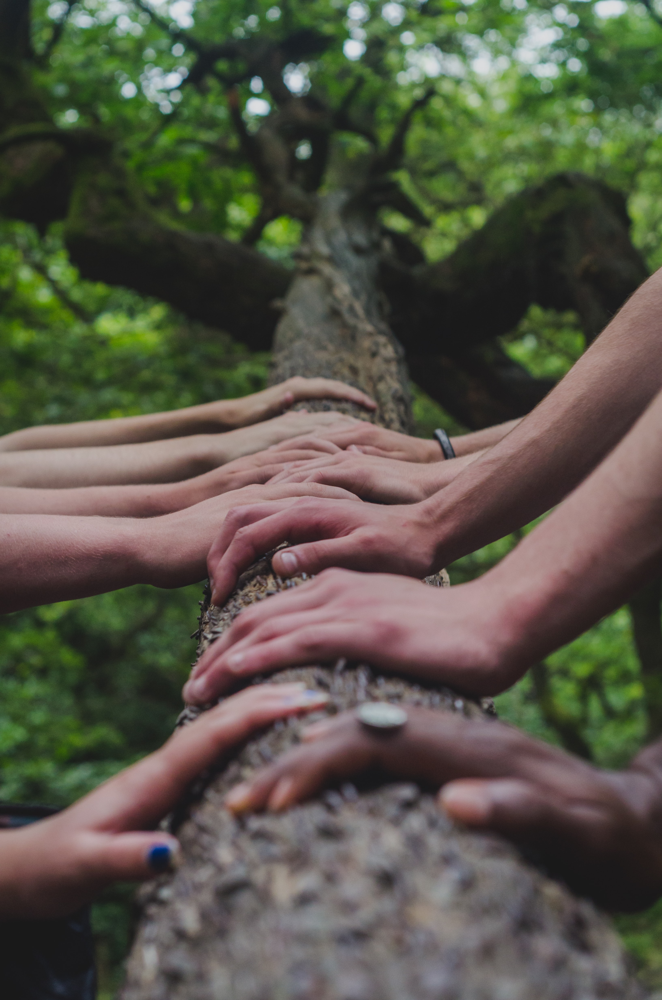

In [148]:
Image(filename='./images/tree_hands.jpg', width=300)

Photo by <a href="https://unsplash.com/@shanerounce?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Shane Rounce</a> on <a href="https://unsplash.com/?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Unsplash</a>

## Team Member Contributions

* Jing
  * EDA Visualizations
  * Random Forest
  * Presentation notes

* Stephanie Cabanela
  * KNN tuning
  * Random Forest tuning
  * Data preprocessing
  * Group meeting communications
  * Created report
  * Presentation notes
  * Polished plots

* Catherine Jimerson
  * Logistic Regression tuning
  * Data preprocessing
  * Model comparisons
  * Presentation notes

* Geet Samra
  * KNN
  * Attempted stratified and quota sampling
  * Presentation notes